

## Description: Problem Overview

New technologies are emerging that can assist those with hearing disabilities, but there is still plenty of work to be done. Computer vision applications, for example, could improve communication with the deaf and hard-of-hearing even more due to advancements in machine learning algorithms.

You are required to build a machine learning model that is capable of identifying American Sign Language (ASL) hand gestures. We will use MobileNetV2 as the base architecture for feature extraction and fine-tuning.

[Dataset Source](https://www.kaggle.com/datasets/gauravduttakiit/sign-language-hand-gesture-recognition?resource=download-directory)



In [1]:
# import required library 
import pandas as pd
import os
from PIL import Image
from sklearn.model_selection import train_test_split
from torchvision import transforms, models
from torch.utils.data import Dataset, DataLoader, Subset
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.nn.parallel import DataParallel

# Loading and sorting of datasets 

In [76]:
import pandas as pd

# read label
my_data = pd.read_csv("data-collection/Training_set.csv")
display(my_data)

# define the path of train_csv and image directory
train_csv = './data-collection/Training_set.csv'
train_image_dir = './data-collection/Images/train'

,filename,label
0,Image_1.jpg,B
1,Image_2.jpg,P
2,Image_3.jpg,J
3,Image_4.jpg,T
4,Image_5.jpg,B
...,...,...
60895,Image_60896.jpg,S
60896,Image_60897.jpg,I
60897,Image_60898.jpg,X
60898,Image_60899.jpg,Q


In [77]:
# sort label to make it easier to read
sorting_data=my_data.sort_values('label')
display(sorting_data)

,filename,label
28602,Image_28603.jpg,A
31330,Image_31331.jpg,A
31374,Image_31375.jpg,A
7219,Image_7220.jpg,A
31421,Image_31422.jpg,A
...,...,...
13087,Image_13088.jpg,space
45368,Image_45369.jpg,space
19462,Image_19463.jpg,space
45401,Image_45402.jpg,space


# Alphabets in the datasets  

In [5]:
import pandas as  pd
# take unique labels
my_data = pd.read_csv("./data-collection/Training_set.csv")
sorting_data = my_data.sort_values('label')
class_names = list(sorting_data.label.unique())
display(class_names)

['A',
 'B',
 'C',
 'D',
 'E',
 'F',
 'G',
 'H',
 'I',
 'J',
 'K',
 'L',
 'M',
 'N',
 'O',
 'P',
 'Q',
 'R',
 'S',
 'T',
 'U',
 'V',
 'W',
 'X',
 'Y',
 'Z',
 'del',
 'nothing',
 'space']

## Exploratory Data Analysis (EDA)
### In machine learning, the first step before developing any robust algorithm is to perform a thorough Exploratory Data Analysis (EDA). This analysis is crucial for understanding the data's structure, identifying any biases, and detecting anomalies that could affect model performance. Our project focuses on a dataset of images, each labeled with a hand gesture from the American Sign Language (ASL) alphabet, used for sign language recognition.

### The primary objective of this EDA is to meticulously explore the dataset to ensure that the data is not only well-understood but also aptly prepared for the subsequent stages of machine learning modeling. This includes assessing the balance of the dataset, visualizing the data to understand the variability within and across classes, and preparing the data through appropriate preprocessing methods. By doing so, we aim to maximize the effectiveness of our predictive models which will be designed to accurately classify each hand gesture into its respective sign language label.

In [18]:
from torch.utils.data import Dataset
from PIL import Image
import pandas as pd

# created a class for image and labels loading 
class SignLanguageDataset(Dataset):
    def __init__(self, csv_file, image_dir, label_map, transform=None):
        self.data = pd.read_csv("./data-collection/Training_set.csv")
        self.image_dir = image_dir
        self.label_map = label_map
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_name = os.path.join(self.image_dir, self.data.iloc[idx, 0])
        image = Image.open(img_name).convert('RGB')
        label = self.label_map[self.data.iloc[idx, 1]]

        if self.transform:
            image = self.transform(image)

        label = torch.tensor(label)

        return image, label
   

In [19]:
# label map
def create_label_map(df):
    labels = df['label'].unique()
    label_map = {label: idx for idx, label in enumerate(labels)}
    return label_map


In [20]:
import os
import shutil
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

my_data = pd.read_csv("data-collection/Training_set.csv")
display(my_data)

# First split: Separate out the initial training set and a temporary set
train_labels, temp_labels = train_test_split(my_data, test_size=0.30, random_state=42)  # Adjust size as needed

# Second split: Divide the temporary set into validation and test sets
val_labels, test_labels = train_test_split(temp_labels, test_size=0.50, random_state=42)  # Split the remaining 30% into two parts

# Save new train, validation, and test CSV files
train_labels.to_csv('./data-collection/Training_set.csv', index=False)
val_labels.to_csv('./data-collection/sample submission.csv', index=False)
test_labels.to_csv('./data-collection/Testing_set.csv', index=False)

print(train_labels)
print(val_labels)






,filename,label
0,Image_27416.jpg,N
1,Image_43767.jpg,L
2,Image_56663.jpg,M
3,Image_47629.jpg,Z
4,Image_8872.jpg,P
...,...,...
42625,Image_54344.jpg,C
42626,Image_38159.jpg,X
42627,Image_861.jpg,J
42628,Image_15796.jpg,H


              filename  label
4475   Image_37989.jpg      Y
15912  Image_27507.jpg      E
36029  Image_26178.jpg      U
22825  Image_36966.jpg      H
33508  Image_56354.jpg      G
...                ...    ...
6265   Image_53847.jpg      Y
11284  Image_54393.jpg  space
38158  Image_34632.jpg      U
860    Image_32055.jpg      G
15795  Image_30140.jpg      K

[29841 rows x 2 columns]
              filename  label
26687  Image_57003.jpg      W
37122  Image_10279.jpg      S
986    Image_26474.jpg      T
418    Image_48414.jpg      U
8723   Image_29272.jpg      S
...                ...    ...
13033  Image_14791.jpg      Y
37754  Image_55836.jpg      X
33797  Image_41140.jpg  space
4156   Image_31684.jpg      U
23348  Image_43054.jpg      Y

[6394 rows x 2 columns]


In [21]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

class SignLanguageDataset(Dataset):
    def __init__(self, csv_file, image_dir, label_map, transform=None):
        self.data = pd.read_csv(csv_file)
        self.image_dir = image_dir
        self.label_map = label_map
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        image_path = os.path.join(self.image_dir, self.data.iloc[idx, 0])
        image = Image.open(image_path)
        label = self.label_map[self.data.iloc[idx, 1]]

        if self.transform:
            image = self.transform(image)

        return image, label
    
    device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')


Displaying images for the label A


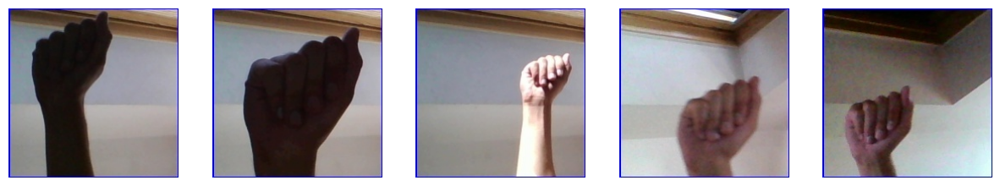

Displaying images for the label B


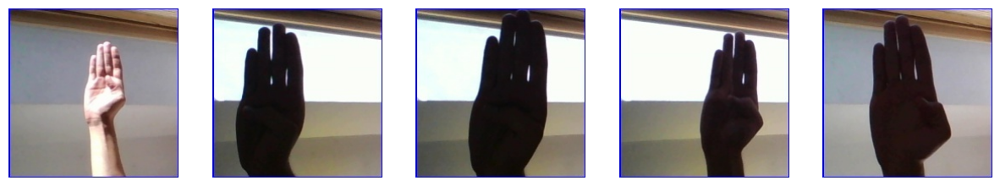

Displaying images for the label C


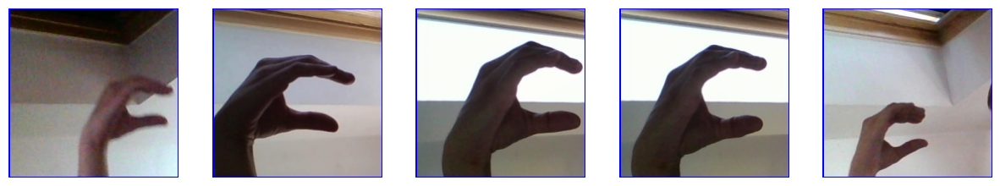

Displaying images for the label D


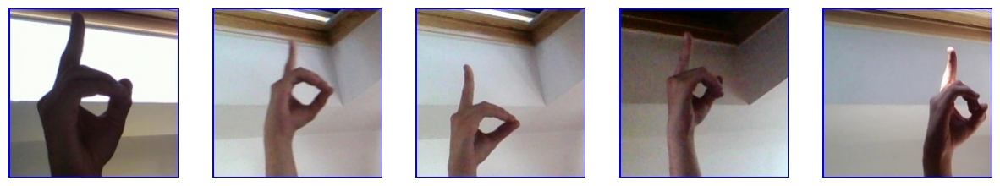

Displaying images for the label E


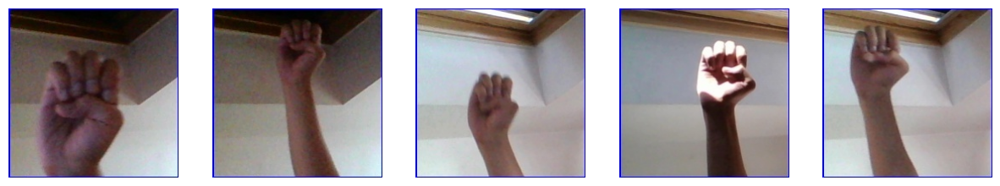

Displaying images for the label F


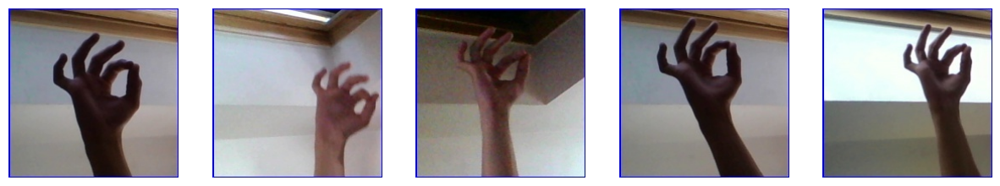

Displaying images for the label G


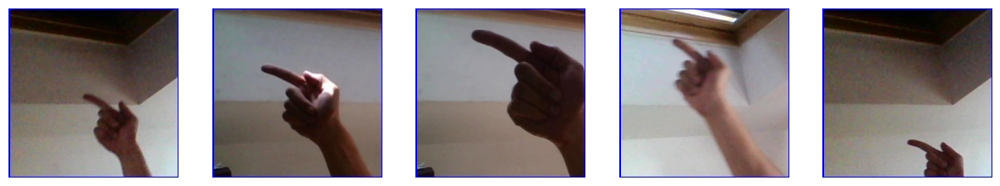

Displaying images for the label H


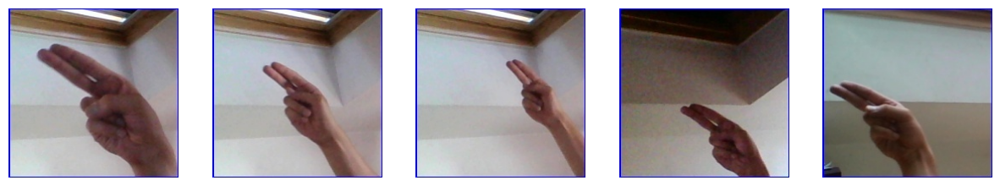

Displaying images for the label I


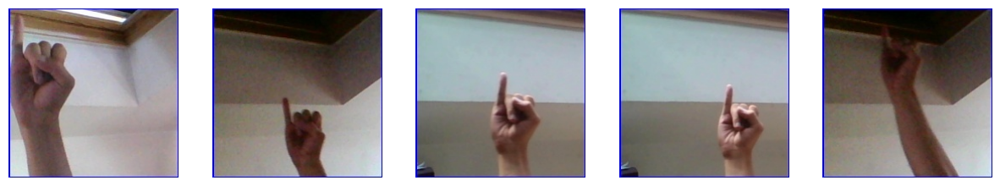

Displaying images for the label J


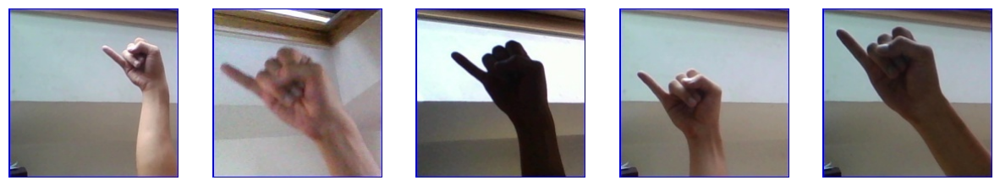

Displaying images for the label K


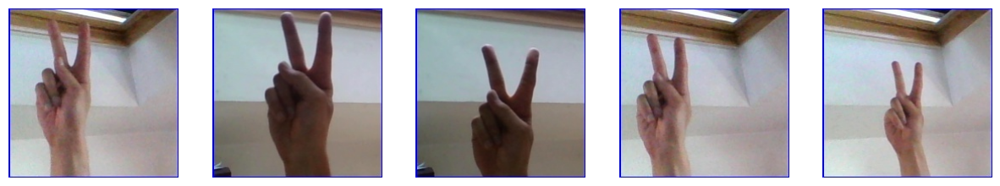

Displaying images for the label L


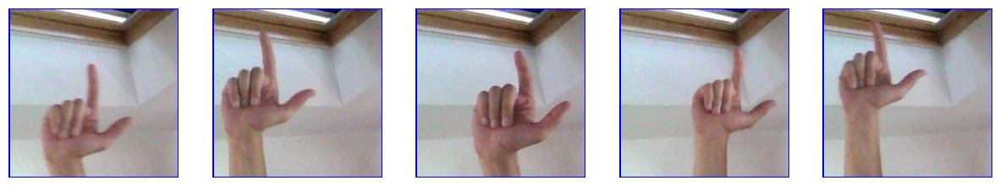

Displaying images for the label M


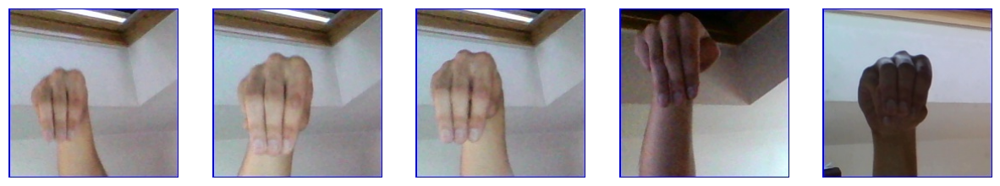

Displaying images for the label N


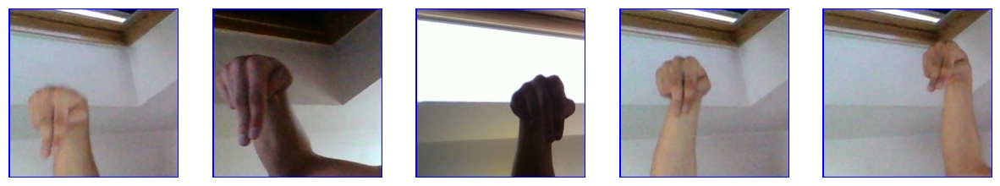

Displaying images for the label O


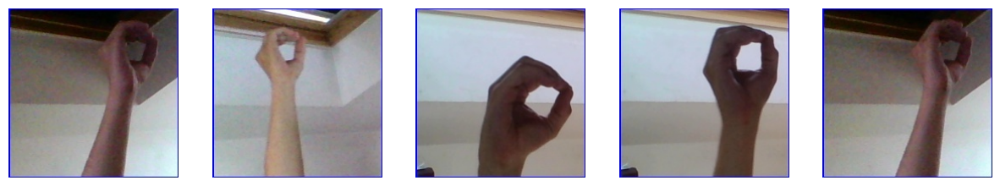

Displaying images for the label P


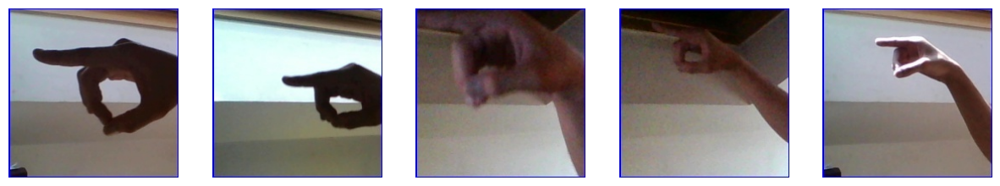

Displaying images for the label Q


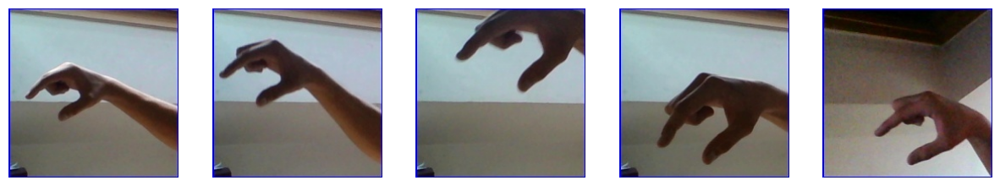

Displaying images for the label R


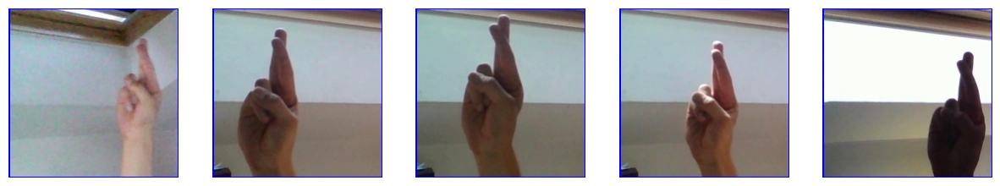

Displaying images for the label S


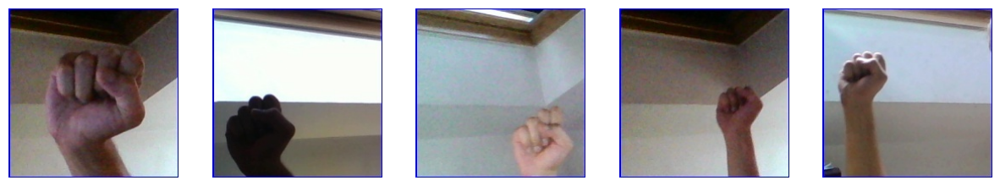

Displaying images for the label T


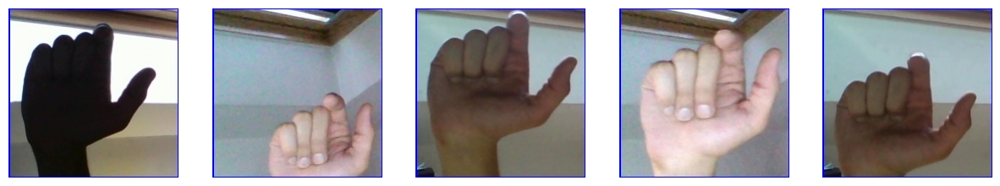

Displaying images for the label U


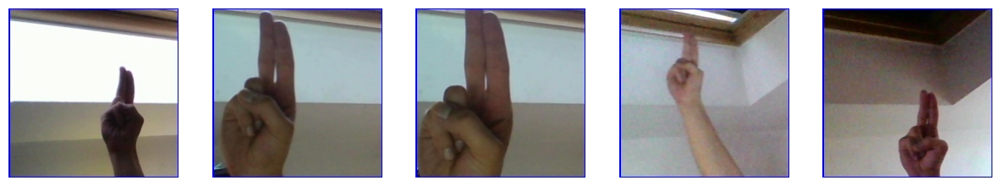

Displaying images for the label V


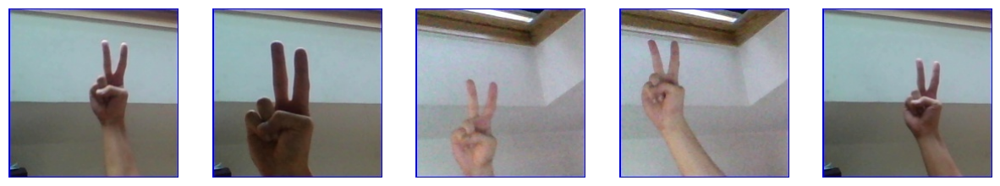

Displaying images for the label W


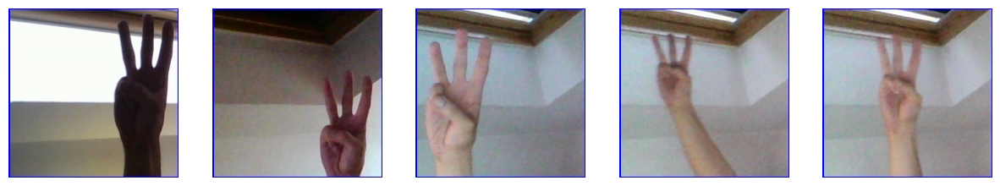

Displaying images for the label X


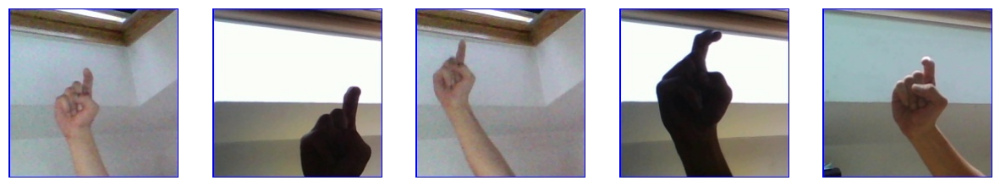

Displaying images for the label Y


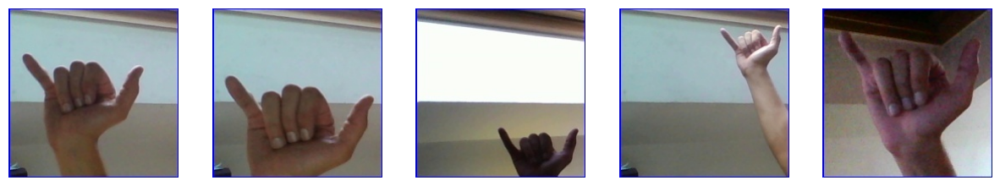

Displaying images for the label Z


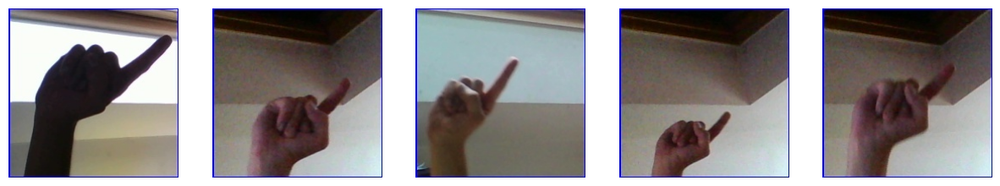

Displaying images for the label Del


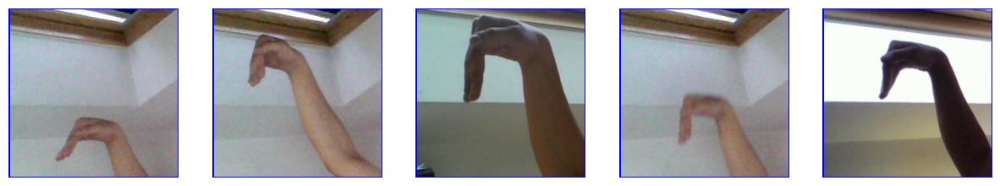

Displaying images for the label nothing


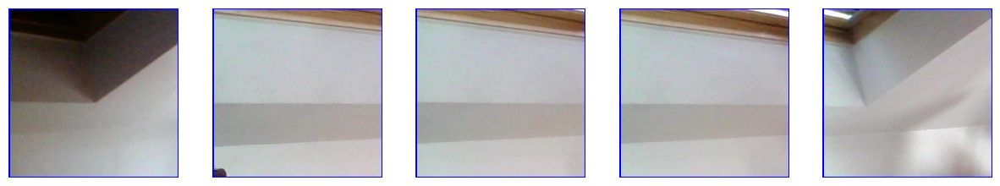

Displaying images for the label space


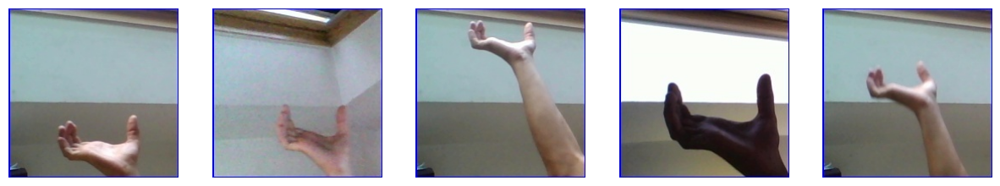

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import pandas as pd

def display_images(data, path, label, num_images=5):
    fig, axes = plt.subplots(1, num_images, figsize=(15, 10))
    selected_images = data[data['label'] == label]['filename'].sample(num_images)
    for ax, img_filename in zip(axes, selected_images):
        img_path = os.path.join(path, img_filename)
        img = plt.imread(img_path)
        ax.imshow(img)
        ax.axis('off')
    plt.show()

# Load the dataset
train = pd.read_csv('./data-collection/Training_set.csv')

# Example of displaying images for the label 'A'
print('Displaying images for the label A')
display_images(train, './data-collection/Images/train', 'A')

# Example of displaying images for the label 'B'
print('Displaying images for the label B')
display_images(train, './data-collection/Images/train', 'B')

# Example of displaying images for the label 'C'
print('Displaying images for the label C')
display_images(train, './data-collection/Images/train', 'C')

# Example of displaying images for the label 'D'
print('Displaying images for the label D')
display_images(train, './data-collection/Images/train', 'D')

# Example of displaying images for the label 'E'
print('Displaying images for the label E')
display_images(train, './data-collection/Images/train', 'E')

# Example of displaying images for the label 'F'
print('Displaying images for the label F')
display_images(train, './data-collection/Images/train', 'F')

# Example of displaying images for the label 'G'
print('Displaying images for the label G')
display_images(train, './data-collection/Images/train', 'G')

# Example of displaying images for the label 'H'
print('Displaying images for the label H')
display_images(train, './data-collection/Images/train', 'H')

# Example of displaying images for the label 'I'
print('Displaying images for the label I')
display_images(train, './data-collection/Images/train', 'I')

# Example of displaying images for the label 'J'
print('Displaying images for the label J')
display_images(train, './data-collection/Images/train', 'J')

# Example of displaying images for the label 'K'
print('Displaying images for the label K')
display_images(train, './data-collection/Images/train', 'K')

# Example of displaying images for the label 'L'
print('Displaying images for the label L')
display_images(train, './data-collection/Images/train', 'L')

# Example of displaying images for the label 'M'
print('Displaying images for the label M')
display_images(train, './data-collection/Images/train', 'M')

# Example of displaying images for the label 'N'
print('Displaying images for the label N')
display_images(train, './data-collection/Images/train', 'N')

# Example of displaying images for the label 'O'
print('Displaying images for the label O')
display_images(train, './data-collection/Images/train', 'O')

# Example of displaying images for the label 'P'
print('Displaying images for the label P')
display_images(train, './data-collection/Images/train', 'P')

# Example of displaying images for the label 'Q'
print('Displaying images for the label Q')
display_images(train, './data-collection/Images/train', 'Q')

# Example of displaying images for the label 'R'
print('Displaying images for the label R')
display_images(train, './data-collection/Images/train', 'R')

# Example of displaying images for the label 'S'
print('Displaying images for the label S')
display_images(train, './data-collection/Images/train', 'S')

# Example of displaying images for the label 'T'
print('Displaying images for the label T')
display_images(train, './data-collection/Images/train', 'T')

# Example of displaying images for the label 'U'
print('Displaying images for the label U')
display_images(train, './data-collection/Images/train', 'U')

# Example of displaying images for the label 'V'
print('Displaying images for the label V')
display_images(train, './data-collection/Images/train', 'V')

# Example of displaying images for the label 'W'
print('Displaying images for the label W')
display_images(train, './data-collection/Images/train', 'W')

# Example of displaying images for the label 'X'
print('Displaying images for the label X')
display_images(train, './data-collection/Images/train', 'X')

# Example of displaying images for the label 'Y'
print('Displaying images for the label Y')
display_images(train, './data-collection/Images/train', 'Y')

# Example of displaying images for the label 'Z'
print('Displaying images for the label Z')
display_images(train, './data-collection/Images/train', 'Z')

# Example of displaying images for the label 'Del'
print('Displaying images for the label Del')
display_images(train, './data-collection/Images/train', 'del')

# Example of displaying images for the label 'nothing'
print('Displaying images for the label nothing')
display_images(train, './data-collection/Images/train', 'nothing')

# Example of displaying images for the label 'space'
print('Displaying images for the label space')
display_images(train, './data-collection/Images/train', 'space')


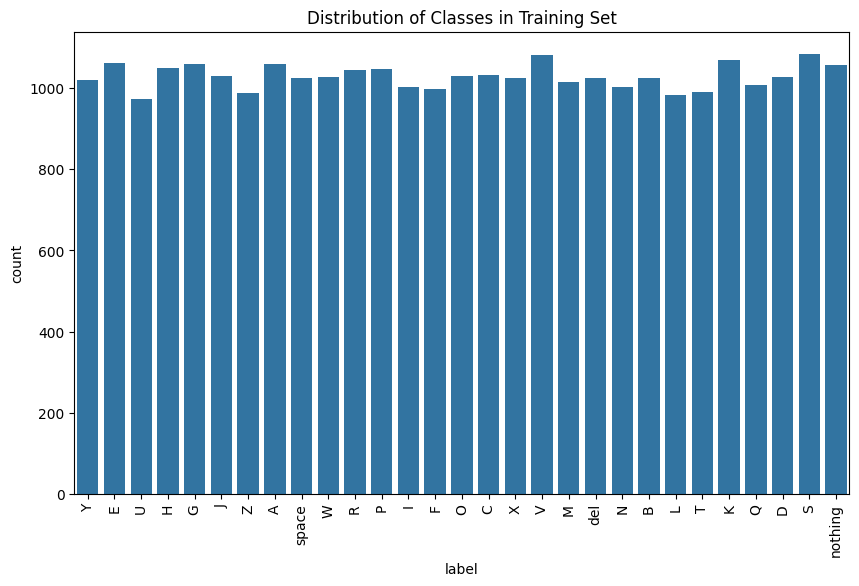

In [23]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

#Reading and Displaying the Training Set:
train = pd.read_csv("data-collection/Training_set.csv")
train.head()

plt.figure(figsize=(10, 6))
sns.countplot(x='label', data=train)
plt.title('Distribution of Classes in Training Set')
plt.xticks(rotation=90)
plt.show()

# Model Evaluation 
## Two pre-trained model classifier will be used to train the datasets(MobilenetV4 and YOLOV8) whereby this code sets a pipeline for  image classification been used is a mobilenetv2 image classifier and custom data augmentation whereby the model is trained using the fit method with the custom data generator for the training and validation sets,evaluation the performance,the mobilenetV2 model gave an accuracy 0.9432(94.3%) saving the best model in .h5 format


In [3]:
import pandas as pd
import os
from PIL import Image
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.callbacks import ModelCheckpoint, Callback

# Function to create label map
def create_label_map(df):
    labels = df['label'].unique()
    label_map = {label: idx for idx, label in enumerate(labels)}
    return label_map

# Load the CSV files
train_csv = './data-collection/Training_set.csv'
train_image_dir = './data-collection/Images/train'

# Create dataset
print("Loading and processing CSV file...")
df = pd.read_csv(train_csv)
label_map = create_label_map(df)

# Split the dataset into training and validation sets
train_df, val_df = train_test_split(df, test_size=0.2, random_state=42)

# Function to load and preprocess image
def load_and_preprocess_image(img_path):
    image = Image.open(img_path).convert('RGB')
    image = image.resize((128, 128))
    image = np.array(image)
    image = image / 255.0  # Normalize to [0, 1]
    return image

# Custom data generator
class CustomDataGenerator(tf.keras.utils.Sequence):
    def __init__(self, df, image_dir, label_map, batch_size=32, is_training=True, augmentations=None):
        self.df = df
        self.image_dir = image_dir
        self.label_map = label_map
        self.batch_size = batch_size
        self.is_training = is_training
        self.augmentations = augmentations
        self.on_epoch_end()
        
    def __len__(self):
        return len(self.df) // self.batch_size

    def __getitem__(self, index):
        batch_df = self.df.iloc[index * self.batch_size:(index + 1) * self.batch_size]
        images = []
        labels = []
        
        for i in range(len(batch_df)):
            img_path = os.path.join(self.image_dir, batch_df.iloc[i, 0])
            image = load_and_preprocess_image(img_path)
            label = self.label_map[batch_df.iloc[i, 1]]
            images.append(image)
            labels.append(label)
        
        images = np.array(images)
        labels = to_categorical(np.array(labels), num_classes=len(self.label_map))

        if self.is_training and self.augmentations:
            images = next(self.augmentations.flow(images, batch_size=self.batch_size, shuffle=False))

        return images, labels

    def on_epoch_end(self):
        if self.is_training:
            self.df = self.df.sample(frac=1).reset_index(drop=True)  # Shuffle the data

# Data augmentation
train_datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True
)

train_generator = CustomDataGenerator(train_df, train_image_dir, label_map, is_training=True, augmentations=train_datagen)
val_generator = CustomDataGenerator(val_df, train_image_dir, label_map, is_training=False)

# Load the MobileNetV2 model
print("Loading MobileNetV2 model...")
base_model = MobileNetV2(input_shape=(128, 128, 3), include_top=False, weights='imagenet')
base_model.trainable = False

# Add custom classification layers on top
model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(len(label_map), activation='softmax')
])

# Compile the model
print("Compiling the model...")
model.compile(optimizer=optimizers.Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Model checkpoint callback
checkpoint = ModelCheckpoint('best_model.keras', monitor='val_accuracy', save_best_only=True, mode='max')

# Custom callback for epoch progress
class EpochProgress(Callback):
    def on_epoch_end(self, epoch, logs=None):
        print(f"Epoch {epoch+1}/{self.params['epochs']} - loss: {logs['loss']:.4f}, accuracy: {logs['accuracy']:.4f}, val_loss: {logs['val_loss']:.4f}, val_accuracy: {logs['val_accuracy']:.4f}")

# Train the model
print("Starting training process...")
history = model.fit(train_generator,
                    validation_data=val_generator,
                    epochs=10,
                    callbacks=[checkpoint, EpochProgress()])

# Evaluate the model on the validation set
print("Evaluating the best model on the validation set...")
best_model = models.load_model('best_model.keras')
val_loss, val_accuracy = best_model.evaluate(val_generator)
print(f'Validation loss: {val_loss:.4f}, accuracy: {val_accuracy*100:.2f}%')

# Save the best model in .h5 format
print("Saving the best model in .h5 format...")
best_model.save('mobilenet_model.h5')
print("Model saved successfully as mobilenet_model.h5")


Loading and processing CSV file...
Loading MobileNetV2 model...
Compiling the model...
Starting training process...
Epoch 1/10


c:\Users\HP\Documents\courses_conestoga\comsign\venv\pytorch_cpu\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1522/1522 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.3748 - loss: 2.1503Epoch 1/10 - loss: 1.5820, accuracy: 0.5172, val_loss: 0.4242, val_accuracy: 0.8827
1522/1522 ━━━━━━━━━━━━━━━━━━━━ 1945s 1s/step - accuracy: 0.3749 - loss: 2.1500 - val_accuracy: 0.8827 - val_loss: 0.4242
Epoch 2/10
1522/1522 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6589 - loss: 1.0455Epoch 2/10 - loss: 1.0089, accuracy: 0.6726, val_loss: 0.3016, val_accuracy: 0.9115
1522/1522 ━━━━━━━━━━━━━━━━━━━━ 3077s 2s/step - accuracy: 0.6589 - loss: 1.0455 - val_accuracy: 0.9115 - val_loss: 0.3016
Epoch 3/10
1522/1522 ━━━━━━━━━━━━━━━━━━━━ 0s 700ms/step - accuracy: 0.7035 - loss: 0.9009Epoch 3/10 - loss: 0.8783, accuracy: 0.7106, val_loss: 0.2601, val_accuracy: 0.9229
1522/1522 ━━━━━━━━━━━━━━━━━━━━ 1279s 836ms/step - accuracy: 0.7035 - loss: 0.9008 - val_accuracy: 0.9229 - val_loss: 0.2601
Epoch 4/10
1522/1522 ━━━━━━━━━━━━━━━━━━━━ 0s 643ms/step - accuracy: 0.7247 - loss: 0.8433Epoch 4/10 - loss: 0.8290, accuracy: 0.7278

Validation loss: 0.1837, accuracy: 94.12%
Saving the best model in .h5 format...
Model saved successfully as mobilenet_model.h5


# YOLO Training 

## Description: YOLO Overview

### In this section, we will evaluate the performance of the machine learning model built for identifying American Sign Language (ASL) hand gestures. We will use a separate dataset for testing purposes to assess the model's accuracy . YOLO will be employed in the training phase for feature extraction and inference.
### Train yolo classification model of given imgsz = 640 for 300 epochs. This model outperformed the others Two so considering this model as further.


In [4]:
import os
import ultralytics
import torch
from ultralytics import YOLO

# Load a pretrained YOLO classification model
model = YOLO('yolov8s-cls.pt')

# Train the model on your dataset
results = model(data="./data-collection/Training_set.csv", epochs=300, imgsz=640, conf=0.1, save=True) 


 

WARNING  'source' is missing. Using 'source=C:\Users\HP\Documents\courses_conestoga\comsign\venv\pytorch_cpu\Lib\site-packages\ultralytics\assets'.

image 1/2 C:\Users\HP\Documents\courses_conestoga\comsign\venv\pytorch_cpu\Lib\site-packages\ultralytics\assets\bus.jpg: 224x224 police_van 0.62, minibus 0.37, ambulance 0.00, recreational_vehicle 0.00, trolleybus 0.00, 195.9ms
image 2/2 C:\Users\HP\Documents\courses_conestoga\comsign\venv\pytorch_cpu\Lib\site-packages\ultralytics\assets\zidane.jpg: 224x224 suit 0.59, bulletproof_vest 0.06, groom 0.03, rugby_ball 0.03, Windsor_tie 0.03, 96.1ms
Speed: 60.7ms preprocess, 146.0ms inference, 2.9ms postprocess per image at shape (1, 3, 224, 224)
Results saved to runs\classify\predict5
